In [1]:
!pip install Bio
!pip install scipy==1.8
!pip install wordcloud
!pip install networkx

Defaulting to user installation because normal site-packages is not writeable

You should consider upgrading via the 'c:\program files\python39\python.exe -m pip install --upgrade pip' command.



Defaulting to user installation because normal site-packages is not writeable

You should consider upgrading via the 'c:\program files\python39\python.exe -m pip install --upgrade pip' command.



Defaulting to user installation because normal site-packages is not writeable

You should consider upgrading via the 'c:\program files\python39\python.exe -m pip install --upgrade pip' command.



Defaulting to user installation because normal site-packages is not writeable

You should consider upgrading via the 'c:\program files\python39\python.exe -m pip install --upgrade pip' command.


In [2]:
#### Libraries import ####

# Bioinformatics toolkit and statistics
from Bio.Blast import NCBIXML
from Bio import SeqIO, AlignIO, Phylo
from scipy.stats import fisher_exact, entropy

# Data manipulation
import numpy as np
import pandas as pd

# Data visualization
import networkx as nx
from matplotlib import rc
import matplotlib.pyplot as plt
from wordcloud import WordCloud

# Utilities
import re
import ast
import gzip
import requests
from io import StringIO
from collections import Counter

# Sequences retrieval and parsing
The following assigned sequence has been used to perform a BLAST Search on EMBL-EBI (https://www.ebi.ac.uk/Tools/sss/ncbiblast/):
`MLGTTDNIAALAEFLRAHPDYQYVLDPVLVANSGGSLGDQATLVKAFVELIPLATLITPNTVELRALTGVTDLDQATQKLFEMGAKAVLVKGGHEDTPDFIKNSLYIDGELAASSTCPRLEGEYHGSGCSLASFIAGRLALGDSLKIAVQHAETWLFGVLKNA`

UniRef50 database has been chosen, and the BLAST alignment views has been set to BLASTXML with 1000 alignemnts, in order to get an output consisting of 1000 homologous proteins in a XML file, which has been parsed and analysed using the following code.

In [3]:
# Parse the XML output
# https://www.biostars.org/p/82514/

input_file = "files/alignments/blast_xml.xml"

with open(input_file) as f:
  blast_records = NCBIXML.parse(f)
  data = []

  # Iterate PSIBLAST rounds (here just one since it is a simple BLAST)
  for blast_record in blast_records:
    query_id = blast_record.query

    # Iterate alignments (here just one)
    for i, alignment in enumerate(blast_record.alignments):
      subject_id = alignment.title

      # Iterate pairwise alignments
      for hsp in alignment.hsps:
          data.append((query_id,
                       subject_id,
                      blast_record.query_length,
                      hsp.query,
                      hsp.match,
                      hsp.sbjct,
                      hsp.query_start,
                      hsp.query_end,
                      hsp.sbjct_start,
                      hsp.sbjct_end,
                      hsp.identities,
                      hsp.positives,
                      hsp.gaps,
                      hsp.expect,
                      hsp.score))
            
          # Skip duplicated subjects
          break

  blast_xml = pd.DataFrame(data, columns=["query_id", "subject_id", "query_len",
                              "query_seq", "match_seq", "subject_seq",
                              "query_start", "query_end", "subject_start", "subject_end", 
                              "identity", "positive", "gaps", "eval", "bit_score"])

In [4]:
# Show the first 10 lines of our parsed BLAST XML
blast_xml.head(10)

,query_id,subject_id,query_len,query_seq,match_seq,subject_seq,query_start,query_end,subject_start,subject_end,identity,positive,gaps,eval,bit_score
0,EMBOSS_001,UR50:UniRef50_A0A059ZJ96 Bifunctional hydroxy-...,163,MLGTTDNIAALAEFLRAHPDYQYVLDPVLVANSGGSLGDQATLVKA...,MLGTTDNIAALAEFLRAHPDYQYVLDPVLVANSGGSLGDQATLVKA...,MLGTTDNIAALAEFLRAHPDYQYVLDPVLVANSGGSLGDQATLVKA...,1,163,79,241,163,163,0,1.198030e-110,826.0
1,EMBOSS_001,UR50:UniRef50_UPI000C18DF3C PfkB family carboh...,163,MLGTTDNIAALAEFLRAHPDYQYVLDPVLVANSGGSLGDQATLVKA...,MLGTTDNIAALAEFLRAHPDYQYVLDPVLVANSGGSLGDQATLVKA...,MLGTTDNIAALAEFLRAHPDYQYVLDPVLVANSGGSLGDQATLVKA...,1,127,79,210,124,125,5,2.181600e-77,605.0
2,EMBOSS_001,UR50:UniRef50_UPI0014859FCF PfkB family carboh...,163,GGSLGDQATLVKAFVELIPLATLITPNTVELRALTGVTDLDQATQK...,GGSLGDQATLVKAFVELIPLATLITPNTVELRALTGVTDLDQATQK...,GGSLGDQATLVKAFVELIPLATLITPNTVELRALTGVTDLDQATQK...,34,122,1,89,89,89,0,4.234750e-55,446.0
3,EMBOSS_001,UR50:UniRef50_UPI000A67C562 bifunctional hydro...,163,VLVKGGHEDTPDFIKNSLYIDGELAASSTCPRLEGEYHGSGCSLAS...,VLVKGGHEDTP+FIKNSLYIDGELAASSTCPRLEGEYHGSGCSLAS...,VLVKGGHEDTPEFIKNSLYIDGELAASSTCPRLEGEYHGSGCSLAS...,88,163,1,76,75,76,0,5.994320e-47,392.0
4,EMBOSS_001,UR50:UniRef50_A0A8X6Z5K1 Hydroxymethylpyrimidi...,163,MLGTTDNIAALAEFLRAHPDYQYVLDPVLVANSGGSLGDQATLVKA...,MLGTTDNI ALAEFL HPDY YVLDPVLVANSGGSLG+Q TLVKA...,MLGTTDNIVALAEFLTVHPDYLYVLDPVLVANSGGSLGNQETLVKA...,1,78,79,156,64,68,0,7.682690e-35,318.0
5,EMBOSS_001,UR50:UniRef50_A0A2P6AV84 Hydroxymethylpyrimidi...,163,MLGTTDNIAALAEFLRAHPDYQYVLDPVLVANSGGSLGDQATLVKA...,MLG+ + I A+ + L H V+DPVL ANSGGSL + L +A...,MLGSAEAIRAVQDSLAGHRHLPVVMDPVLAANSGGSLAME-DLRQA...,1,163,79,239,73,99,2,6.238380e-34,320.0
6,EMBOSS_001,UR50:UniRef50_A0A7J6Z468 HTH araC/xylS-type do...,163,MGAKAVLVKGGHEDTPDFIKNSLYIDGELAASSTCPRLEGEYHGSG...,MGA+AVLVKGGHEDTPD+I+N+LY++GE+ S CPRL GEYHGSG...,MGAQAVLVKGGHEDTPDYIRNALYVNGEMITESKCPRLAGEYHGSG...,83,154,1,72,59,66,0,1.167340e-32,320.0
7,EMBOSS_001,UR50:UniRef50_A0A496W9C2 Hydroxymethylpyrimidi...,163,MLGTTDNIAALAEFLRAHPDYQYVLDPVLVANSGGSLGDQATLVKA...,+LG+ D + A+A+ L +P VLDPVL A G SL Q + A...,LLGSVDIVEAVAQVLLKYPQIPVVLDPVLAAGGGQSLM-QGNVCSA...,1,161,81,240,68,96,3,9.592570e-30,293.0
8,EMBOSS_001,UR50:UniRef50_A0A536UU17 Bifunctional hydroxym...,163,LGTTDNIAALAEFLRAHPDYQYVLDPVLVANSGGSLGDQATLVKAF...,LG+ +NIAA+AE L +PD VLDPVL + G L L ...,LGSVENIAAIAEILSDYPDVPLVLDPVLASGRGDELASDEMLHALR...,2,163,90,255,70,94,6,1.342310e-29,293.0
9,EMBOSS_001,UR50:UniRef50_A0A536VT17 Bifunctional hydroxym...,163,LGTTDNIAALAEFLRAHPDYQYVLDPVLVANSGGSLGDQATLVKAF...,LG+ +NIAA+AE L +PD VLDPVL + G L + L ...,LGSVENIAAIAEILSDYPDVPLVLDPVLASGRGDELANDEMLHAMR...,2,163,90,255,69,94,6,3.724370e-29,290.0


The following step makes a .list file containing all the UniRef50 ID of the set of homologous proteins found using BLAST.

In [5]:
# Extract UniRef50 accessions

out_file = "files/mappings/out/uniref50_id.list"

# UniRef50 dataframe

with open(out_file, "w") as fout:
  accessions = list(set([acc.split()[0].split(":")[1] for acc in blast_xml["subject_id"]]))
  fout.write("\n".join(accessions) + "\n")

The list of UniRef50 ID can then be be used to retrieve the actual whole sequences of the proteins, using the retrieve/ID mapping service provided by UniProt (https://www.uniprot.org/id-mapping), by mapping each ID from UniProt/UniRef50 to UniProt/UniRef50 and downloading a FASTA file of the sequences. This fise has been used to generate a multiple sequence alignment (MSA) using tools ClustalOmega (using Pearson/FASTA as output format) (https://www.ebi.ac.uk/Tools/msa/clustalo/).

# MSA editing for model improvement
The MSA generated previously should be now processed, since it should be as fine as possible to be used for generating good models. For this purpose, two metrics are provided in this section, the occupancy and the entropy, used together as a guide to select the more conserved columns in the MSA.

In [6]:
# Parse the MSA in an array matrixp
seqs_array = []
with open("files/alignments/MSA.fasta") as f:
    for record in AlignIO.read(f, "fasta"):
        seqs_array.append(list(record.seq))  # store sequence as a list of characters
seqs_array = np.array(seqs_array, dtype="str")
seqs_array

array([['-', '-', '-', ..., '-', '-', '-'],
       ['-', '-', '-', ..., '-', '-', '-'],
       ['-', '-', '-', ..., '-', '-', '-'],
       ...,
       ['-', '-', '-', ..., '-', '-', '-'],
       ['-', '-', '-', ..., '-', '-', '-'],
       ['-', '-', '-', ..., '-', '-', '-']], dtype='<U1')

In [7]:
aa = ["A", "R", "N", "D", "C", "E", "Q", "G", "H", "I", "L", "K", "M", "F", "P", "S", "T", "W", "Y", "V"]

data = []
for i, column in enumerate(seqs_array.T):

    # count AA in column
    count = Counter(column)
    count.pop('-')
    count_sorted = sorted(count.items(), key=lambda x:x[1], reverse=True)

    # count non gap AA
    non_gap = np.count_nonzero(column != "-")

    occupancy = non_gap / column.size

    # AA probability in column (gap excluded)
    # probabilities = [count.get(k, 0.0) / column.size for k in aa]
    probabilities = [count.get(k, 0.0) / non_gap for k in aa]

    # Zero entropy = complete conservation
    entr = entropy(probabilities, base=20)

    data.append([i, occupancy, entr, count_sorted])
conservation = pd.DataFrame(data, columns=["pos", "occupancy", "entropy", "counts"])

C:\Users\Florenzio\AppData\Roaming\Python\Python39\site-packages\scipy\stats\_entropy.py:77: RuntimeWarning: invalid value encountered in true_divide
  pk = 1.0*pk / np.sum(pk, axis=axis, keepdims=True)


In [8]:
# Occupancy > 0.5 -> at least half of the hits are aligned

conservation[(conservation["occupancy"] > 0.5) & (conservation["entropy"] < 0.3)]

,pos,occupancy,entropy,counts
2883,2883,0.857,0.209875,"[(L, 742), (M, 43), (W, 25), (V, 17), (I, 10),..."
2886,2886,0.857,0.278826,"[(I, 646), (V, 136), (F, 33), (L, 28), (M, 6),..."
2887,2887,0.857,0.198216,"[(A, 709), (G, 86), (S, 59), (T, 2), (I, 1)]"
2888,2888,0.858,0.070121,"[(G, 825), (A, 21), (T, 4), (S, 4), (M, 1), (P..."
2890,2890,0.858,0.040459,"[(D, 842), (E, 8), (R, 3), (A, 1), (Y, 1), (P,..."
2893,2893,0.859,0.177599,"[(G, 744), (A, 75), (S, 26), (C, 7), (N, 3), (..."
2894,2894,0.858,0.104689,"[(G, 813), (A, 15), (C, 9), (S, 5), (V, 3), (F..."
2895,2895,0.859,0.051250,"[(A, 837), (G, 10), (S, 6), (T, 3), (Y, 2), (V..."
2896,2896,0.859,0.008501,"[(G, 856), (A, 2), (Q, 1)]"
2908,2908,0.860,0.232132,"[(A, 743), (R, 33), (V, 19), (T, 14), (G, 10),..."


The last table outputted above shows positions which can be considered conserved. For editing the MSA, Jalview has been used (https://www.jalview.org/). The whole MSA has been opened and visualized in its whole (using the percentage identity colour and overview window function). Using Jalview and table above, all the columns at the left of the min position (2883) and all the columns at the right of the max position (4239) have been removed. In this way a continue alignment sequence containing most conserved position was obtained. Then, to perform a raw-based processing, redundancy has been removed, using the Jalview built-in tool with a tolerance of 98/100.

# Model comparison
The edited MSA has been used to generate two models, a PSSM model, using the command line version of BLAST (https://ftp.ncbi.nlm.nih.gov/blast/executables/blast+/LATEST), and a HMM model, using the command line version of HMMER (http://eddylab.org/software/hmmer). The used commands are the following:

`*BLAST_PATH* -subject *SEQUENCE_PATH* -in_msa *MSA_PATH* -out_ascii_pssm *ASCII_PSSM_OUTPUT* -out_pssm *PSSM_OUTPUT*` (BLAST command)

`*HMMER_PATH**HMM_OUTPUT* *MSA_PATH*` (HMMER command)

These two models must be compared with a groundtruth, that has been made using a previously given Pham ID: PF08543. For calculating the groundtruth and HMM-based prediction HMMSEARCH service has been utilized (https://www.ebi.ac.uk/Tools/hmmer/search/hmmsearch), while for calculating the PSSM-based prediction, PSI-Blast has been used (https://blast.ncbi.nlm.nih.gov/Blast.cgi), stopping the search at the second iteration with a max of 625 proteins. Both services are set to SwissProt as reference database.

The three files produced are used below for testing the accuracy of the two models, using several metrics and two different paradigms: a protein-level-based one and a residue-level-based-one.

In [9]:
def specificity(tn, fp):
  spec = tn / (fp + tn)
  return spec

def precision(tp, fp):
    prec = tp / (tp + fp)
    return prec

def recall(tp, fn):
    rec = tp / (tp + fn)
    return rec

In [10]:
def f1_score(precision, recall):
  f1 = 2 * (precision * recall) / (precision + recall)
  return f1

def balanced_accuracy(sensitivity, specificity):
    balanced_acc = (sensitivity + specificity) / 2
    return balanced_acc

def matthews_correlation_coefficient(tp, fp, fn, tn):
  numerator = tp * tn - fp * fn
  denominator = np.sqrt((tp + fp) * (tp + fn) * (tn + fp) * (tn + fn))
  MCC = numerator / denominator
  return MCC

In [11]:
df_groundtruth = pd.read_csv("files/models/PFAM_model_hmm.tsv", sep="\t")

In [12]:
thr = 0.01

groundtruth = set(df_groundtruth[df_groundtruth["E-value"] < thr]["Target Accession"])
print("Total entries: {}".format(df_groundtruth.shape[0]))
print("Meaningful entries (E-value < {}): {}".format(thr, len(groundtruth)))

Total entries: 649
Meaningful entries (E-value < 0.01): 648


# Comparison at the protein level





In [13]:
# HMMSEARCH
hmmsearch_file = "files/models/HMM_based_model.tsv"

data = []
hmm_model = pd.read_csv("{}".format(hmmsearch_file), sep="\t")
hmm_prediction = set(hmm_model.loc[hmm_model["E-value"] < 0.01]["Target Accession"])
data.append([hmmsearch_file,
             len(groundtruth.intersection(hmm_prediction)),
             len(hmm_prediction - groundtruth),
             len(groundtruth - hmm_prediction)])
hmm_model_confusion = pd.DataFrame(data, columns=["file", "TP", "FP", "FN"])

hmm_model_confusion

,file,TP,FP,FN
0,files/models/HMM_based_model.tsv,406,13,242


In [14]:
Swiss_prot_tot = 568744

hmm_tp = hmm_model_confusion["TP"][0]
hmm_fp = hmm_model_confusion["FP"][0]
hmm_fn = hmm_model_confusion["FN"][0]
hmm_tn = Swiss_prot_tot - hmm_tp - hmm_fp - hmm_fn

In [15]:
hmm_prec = precision(hmm_tp, hmm_fp)
hmm_rec = recall(hmm_tp, hmm_fn)

hmm_sens = hmm_rec
hmm_spec = specificity(hmm_tn, hmm_fp)

hmm_f1 = f1_score(hmm_prec, hmm_rec)
hmm_balanced_acc = balanced_accuracy(hmm_sens, hmm_spec)
hmm_MCC = matthews_correlation_coefficient(hmm_tp, hmm_fp, hmm_fn, hmm_tn)

print("Specificity score: {}".format(round(hmm_spec, 4)))
print("Precision score: {}".format(round(hmm_prec, 4)))
print("Recall / sensitivity score: {}".format(round(hmm_rec, 4)))

print("\nF1-score: {}".format(round(hmm_f1, 4)))
print("Balanced accuracy: {}".format(round(hmm_balanced_acc, 4)))
print("Matthews Correlation Coefficient: {}".format(round(hmm_MCC, 4)))

Specificity score: 1.0
Precision score: 0.969
Recall / sensitivity score: 0.6265

F1-score: 0.761
Balanced accuracy: 0.8133
Matthews Correlation Coefficient: 0.779


In [16]:
# Extract accessions

out_file = "files/mappings/out/PFAM_mapping.list"

with open(out_file, "w") as fout:
  for accession in groundtruth:
    fout.write(accession + "\n")

In [17]:
# Here we need the mapped version for merging the datasets
PFAM_mapping = pd.read_csv("files/mappings/PFAM_mapping_IDS.tsv", sep="\t")

In [18]:
groundtruth_blast = pd.merge(df_groundtruth, PFAM_mapping, left_on = "Target Accession", right_on = ["From"], how = "inner")

In [19]:
# Groundtruth for BLAST
groundtruth = set(groundtruth_blast[groundtruth_blast["E-value"]<0.01]["Entry"])
len(groundtruth)

636

In [20]:
# PSI-BLAST
psiblast_file = "files/models/PSSM_based_model.csv"

data = []
pssm_model = pd.read_csv("{}".format(psiblast_file), names=["query", "subject", "identity", "alignment_length", "mismatches", "gap_opens", "q_start", "q_end", "s_start", "s_end", "evalue", "bit_score", "q_coverage"])
pssm_model[["acc", "version"]] = pssm_model["subject"].str.split(".", 1, expand=True)
pssm_prediction = set(pssm_model.loc[pssm_model["evalue"] < 0.01]["acc"])
data.append([psiblast_file,
             len(groundtruth.intersection(pssm_prediction)),
             len(pssm_prediction - groundtruth),
             len(groundtruth - pssm_prediction)])
pssm_model = pd.DataFrame(data, columns=["file", "TP", "FP", "FN"])
pssm_model

,file,TP,FP,FN
0,files/models/PSSM_based_model.csv,489,136,147


In [21]:
pssm_tp = pssm_model["TP"][0]
pssm_fp = pssm_model["FP"][0]
pssm_fn = pssm_model["FN"][0]
pssm_tn = Swiss_prot_tot - pssm_tp - pssm_fp - pssm_fn

In [22]:
pssm_prec = precision(pssm_tp, pssm_fp)
pssm_rec = recall(pssm_tp, pssm_fn)

pssm_sens = pssm_rec
pssm_spec = specificity(pssm_tn, pssm_fp)

pssm_f1 = f1_score(pssm_prec, pssm_rec)
pssm_balanced_acc = balanced_accuracy(pssm_sens, pssm_spec)
pssm_MCC = matthews_correlation_coefficient(pssm_tp, pssm_fp, pssm_fn, pssm_tn)

print("Specificity score: {}".format(round(pssm_spec, 4)))
print("Precision score: {}".format(round(pssm_prec, 4)))
print("Recall / sensitivity score: {}".format(round(pssm_rec, 4)))

print("\nF1-score: {}".format(round(pssm_f1, 4)))
print("Balanced accuracy: {}".format(round(pssm_balanced_acc, 4)))
print("Matthews Correlation Coefficient: {}".format(round(pssm_MCC, 4)))

Specificity score: 0.9998
Precision score: 0.7824
Recall / sensitivity score: 0.7689

F1-score: 0.7756
Balanced accuracy: 0.8843
Matthews Correlation Coefficient: 0.7754


# Comparison at the residue level 

In [23]:
# HMMSEARCH
hmm_model_residue = pd.read_csv("{}".format(hmmsearch_file), sep="\t")

In [24]:
hmm_tp_residue = 0
for i in range(len(hmm_model_residue["Target Name"])): # iterate all over the predicted hits
  for j in range(len(df_groundtruth["Target Name"])):
    if hmm_model_residue["Target Name"][i] == df_groundtruth["Target Name"][j]: # check if a predicted hit correspond to a hit provided by the treshold model
      if (hmm_model_residue["Target Ali. Start"][i] >= df_groundtruth["Target Ali. Start"][j] & hmm_model_residue["Target Ali. End"][i] <= df_groundtruth["Target Ali. End"][j]): #check if the alignment start and finish at the same position
          hmm_tp_residue += 1

In [25]:
hmm_fn_residue = len(groundtruth) - hmm_tp_residue
hmm_fp_residue = len(hmm_model_residue) - hmm_tp_residue
hmm_tn_residue = Swiss_prot_tot - hmm_tp_residue - hmm_fp_residue - hmm_fn_residue

In [26]:
hmm_prec_residue = precision(hmm_tp_residue, hmm_fp_residue)
hmm_rec_residue = recall(hmm_tp_residue, hmm_fn_residue)

hmm_sens_residue = hmm_rec_residue
hmm_spec_residue = specificity(hmm_tn_residue, hmm_fp_residue)

hmm_f1_residue = f1_score(hmm_prec_residue, hmm_rec_residue)
hmm_balanced_acc_residue = balanced_accuracy(hmm_sens_residue, hmm_spec_residue)
hmm_MCC_residue = matthews_correlation_coefficient(hmm_tp_residue, hmm_fp_residue, hmm_fn_residue, hmm_tn_residue)

print("Specificity score: {}".format(round(hmm_spec_residue, 4)))
print("Precision score: {}".format(round(hmm_prec_residue, 4)))
print("Recall / sensitivity score: {}".format(round(hmm_rec_residue, 4)))

print("\nF1-score: {}".format(round(hmm_f1_residue, 4)))
print("Balanced accuracy: {}".format(round(hmm_balanced_acc_residue, 4)))
print("Matthews Correlation Coefficient: {}".format(round(hmm_MCC_residue, 4)))

Specificity score: 0.9999
Precision score: 0.8714
Recall / sensitivity score: 0.5755

F1-score: 0.6932
Balanced accuracy: 0.7877
Matthews Correlation Coefficient: 0.7079


In [27]:
groundtruth_blast = pd.merge(df_groundtruth, PFAM_mapping, left_on="Target Accession", right_on=["From"], how="inner")

In [28]:
# PSI-BLAST
data = []
pssm_model_residue = pd.read_csv("{}".format(psiblast_file), 
                 names=["query", "subject", "identity", "alignment_length", "mismatches", "gap_opens", "q_start", "q_end", "s_start", "s_end", "evalue", "bit_score", "q_coverage"])
pssm_model_residue[["acc", "version"]] = pssm_model_residue["subject"].str.split(".", 1, expand=True)

In [29]:
pssm_tp_residue = 0
for i in range(len(pssm_model_residue["subject"])): # iterate all over the predicted hits
  for j in range(len(groundtruth_blast["Entry"])): # iterate over PFAM
    if pssm_model_residue["acc"][i] == groundtruth_blast["Entry"][j]: # check if a predicted hit correspond to a hit provided by the treshold model
      if (pssm_model_residue["s_start"][i] >= groundtruth_blast["Target Ali. Start"][j] & pssm_model_residue["s_end"][i] <= groundtruth_blast["Target Ali. End"][j]): #check if the alignment start and finish at the same position
          pssm_tp_residue += 1

In [30]:
pssm_fn_residue = len(groundtruth_blast) - pssm_tp_residue
pssm_fp_residue = len(pssm_model_residue) - pssm_tp_residue
pssm_tn_residue = Swiss_prot_tot - pssm_tp_residue - pssm_fp_residue - pssm_fn_residue

In [31]:
pssm_prec_residue = precision(pssm_tp_residue, pssm_fp_residue)
pssm_rec_residue = recall(pssm_tp_residue, pssm_fn_residue)

pssm_sens_residue = pssm_rec_residue
pssm_spec_residue = specificity(pssm_tn_residue, pssm_fp_residue)

pssm_f1_residue = f1_score(pssm_prec_residue, pssm_rec_residue)
pssm_balanced_acc_residue = balanced_accuracy(pssm_sens_residue, pssm_spec_residue)
pssm_MCC_residue = matthews_correlation_coefficient(pssm_tp_residue, pssm_fp_residue, pssm_fn_residue, pssm_tn_residue)

print("Specificity score: {}".format(round(pssm_spec_residue, 4)))
print("Precision score: {}".format(round(pssm_prec_residue, 4)))
print("Recall / sensitivity score: {}".format(round(pssm_rec_residue, 4)))

print("\nF1-score: {}".format(round(pssm_f1_residue, 4)))
print("Balanced accuracy: {}".format(round(pssm_balanced_acc_residue, 4)))
print("Matthews Correlation Coefficient: {}".format(round(pssm_MCC_residue, 4)))

Specificity score: 0.9995
Precision score: 0.5168
Recall / sensitivity score: 0.5071

F1-score: 0.5119
Balanced accuracy: 0.7533
Matthews Correlation Coefficient: 0.5114


Considering all the accuracy results, the PSSM-based prediction model has been selected for subsequent analyses

# Taxonomic lineage

Here the taxonomy lineage for each protein is provided, plotting also a dendrogram-like taxonomic tree for showing evolutive relationships. This tree has been calculated using the NCBI IDs for the species of each protein as input for hte CommonTree NCBI service (https://www.ncbi.nlm.nih.gov/Taxonomy/CommonTree/wwwcmt.cgi), which outputs a tree file in .phy format and in newick codec.

In [32]:
URL = "https://www.ebi.ac.uk/proteins/api"
URL_proteins = "{}/proteins".format(URL)
URL_taxonomy = "{}/taxonomy".format(URL)

def chunks_div(lst, chunk_l = 100): # The request can accept not more than 100 input accessions in a row, so we must divide our model in chunks
  for i in range(0, len(lst), chunk_l):

    yield lst[i : i + chunk_l]

lineages = dict()
IDs = dict()
pred_part = list(chunks_div(list(pssm_prediction)))

for part in pred_part:
  r = requests.get(URL_proteins, params={"accession": ",".join(part)}, headers={"Accept": "application/json"})
  struct = r.json()
  for body in struct:
    lineage = body["organism"]["lineage"]
    lineage.append(body["organism"]["names"][0]["value"])
    lineages[body["accession"]] = lineage
    IDs[body["accession"]] = body["organism"]["taxonomy"]

In [33]:
def build_hierarchy(branches):
  hierarchy = {}
  for branch in branches:
    current = hierarchy
    for node in branch:
      current = current.setdefault(node, {})
  return hierarchy

def nested_dict_to_nodes_and_edges(d, parent=None):
  nodes = set()
  edges = set()

  for k, v in d.items():
    nodes.add(k)

    if parent is not None:
      edges.add((parent, k))

    if isinstance(v, dict):
      child_nodes, child_edges = nested_dict_to_nodes_and_edges(v, k)
      nodes |= child_nodes
      edges |= child_edges

  return nodes, edges

def save_tree_figure(G, node_sizes, file_name, path_save = "", labels = None):
  pos = nx.kamada_kawai_layout(G, scale = 4) # Layout for node disitribution on the plane

  node_size_values = [node_sizes[node] for node in G.nodes()]
  node_colors = node_size_values
  vmin = min(node_size_values)
  vmax = max(node_size_values)

  fig = plt.figure(figsize = (40, 40), dpi = 200)

  # Main plot
  nx.draw(G,
          pos,
          node_size=[v * 75 for v in node_size_values],
          node_color = node_colors, cmap = plt.cm.viridis,
          vmin = vmin,
          vmax = vmax,
          with_labels = False)

  if labels is not None: # Second plot to draw the labels
    nx.draw_networkx_labels(G, pos, labels, font_size = 20)

  plt.savefig("{}/{}_specific_tree.png".format(path_save, file_name), dpi = 200)


# Shrinked lineages
lineages_shrinked = [taxa[:-2] for taxa in lineages.values()] # Family level shrinkage

# Build a nested dictionary for representing the hierarchy

hierarchy = build_hierarchy(lineages_shrinked)

# Provide frequencies for each taxon (for node sizes)

tot_taxa = list()
for taxa in lineages_shrinked:
  for taxon in taxa:
    tot_taxa.append(taxon)

taxa_freq = Counter(tot_taxa)

for main_taxon in hierarchy.keys():
  # Extract from the nested dictionary hierarchy nodes and edges for networkx 
  nodes, edges = nested_dict_to_nodes_and_edges(hierarchy[main_taxon])

  # Build the tree object
  G = nx.Graph()
  G.add_nodes_from(nodes)
  G.add_edges_from(edges)

  # Labels making
  taxa_freq_filtered = {taxon : freq for taxon, freq in taxa_freq.items() if freq >= 10} # Only labels of more frequent groups have been shown
  labels = {taxon : taxon for taxon in taxa_freq_filtered.keys() if taxon in nodes}

  # Render the tree
  save_tree_figure(G, taxa_freq, main_taxon, path_save = "files/taxonomy/out", labels = labels)

In [34]:
f = open("files/taxonomy/taxids.txt", "w")
for id in IDs.values():
  f.write(str(id))
  f.write("\n")
f.close()

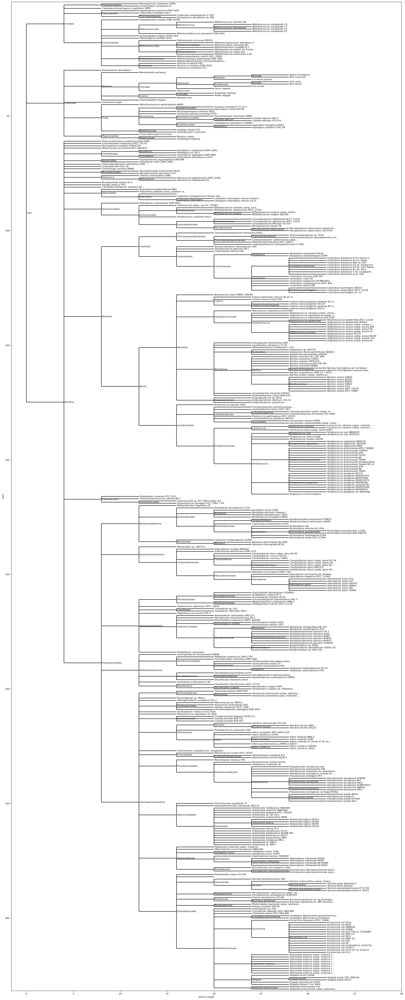

In [35]:
def plot_tree(tree, output_file):
    tree = Phylo.read(tree, "newick")
    rc("font", size = 8)
    fig = plt.figure(figsize = (25, 65), dpi = 200)
    axes = fig.add_subplot(1, 1, 1)
    Phylo.draw(tree, axes = axes, do_show = False)
    plt.savefig(output_file, dpi = 200)

plot_tree("files/taxonomy/tree.phy", "files/taxonomy/out/tree.png")

# Function analysis

This section is dedicatd to provide a functional analysis of the PSSM-based prediction model, parsing the gene ontology OBO file and making a GAF-like file, made by processing the complete SwissProt set obtained using UniProt TSV table making service (https://www.uniprot.org/uniprotkb?query=reviewed:true), in which is possible to shrink the table to Uniprot accessions and direct annotations GO IDs.

For the analysis purposes, complete ancestors, direct children and roots have been calculated for each ancestors. Also, several metrics and procedures have been implemented, like confusion matrices calculation, fold-increase, and Fisher exact test. Finally a wordcloud plot and a branches enrichment analyses are provided.

In [36]:
## OBO file parser ##
def obo_parser(obo_file, valid_rel=("is_a", "part_of")):
    """
    Parse a OBO file and returns a list of ontologies, one for each namespace.
    Obsolete terms are excluded as well as external namespaces
    """
    term_dict = {}
    term_id = None
    namespace = None
    name = None
    term_def = None
    alt_id = []
    rel = []
    obsolete = True
    with open(obo_file) as f:
        for line in f:
            line = line.strip().split(": ")
            if line and len(line) > 1:
                k = line[0]
                v = ": ".join(line[1:])
                if k == "id":
                    # Populate the dictionary with the previous entry
                    if term_id is not None and obsolete is False and namespace is not None:
                        term_dict[term_id] = {"id": term_id,
                                                                        "name": name,
                                                                       "namespace": namespace,
                                                                       "def": term_def,
                                                                       "alt_id": alt_id,
                                                                       "rel": rel}
                    # Assign current term ID
                    term_id = v

                    # Reset optional fields
                    alt_id = []
                    rel = []
                    obsolete = False
                    namespace = None

                elif k == "alt_id":
                    alt_id.append(v)
                elif k == "name":
                    name = v
                elif k == "namespace" and v != "external":
                    namespace = v
                elif k == "def":
                    term_def = v
                elif k == "is_obsolete":
                    obsolete = True
                elif k == "is_a" and k in valid_rel:
                    s = v.split("!")[0].strip()
                    rel.append(s)
                elif k == "relationship" and v.startswith("part_of") and "part_of" in valid_rel:
                    s = v.split()[1].strip()
                    rel.append(s)

        # Last record
        if obsolete is False and namespace is not None:
            term_dict[term_id] = {"id": term_id,
                                                          "name": name,
                                                          "namespace": namespace,
                                                          "def": term_def,
                                                          "alt_id": alt_id,
                                                          "rel": rel}
    return term_dict

In [37]:
# OBO parsing into a dictionary

graph_dict = obo_parser("files/function/OBO.obo")

In [38]:
# Ancestors and roots calculation

ancestors = dict()

for node in graph_dict:
  c = 0
  node_ancestors = list()
  node_parents = graph_dict[node].get("rel")

  while node_parents:
    node_ancestors.extend(node_parents)
    terms = []
    for parent in node_parents:
      rels = graph_dict[parent].get("rel", [])
      for term in rels:
        terms.append(term)
    node_parents = terms

  ancestors[node] = set(node_ancestors)

roots = [term for term, term_ancestors in ancestors.items() if not term_ancestors]

In [39]:
# SwissProt TSV processing

swiss_prots = pd.read_csv("files/function/swiss_prot_terms.tsv", sep = "\t")
swiss_prots.dropna(inplace = True)

prot_annot = dict()

for row in range(swiss_prots.shape[0]):
  prot = swiss_prots.iloc[row, :]
  prot_annot[prot["Entry"]] = set(prot["Gene Ontology IDs"].split("; "))

In [40]:
# Propagation step made to include all the ancestors to proteins list of annotations

not_found = list()

def propagation(accession, terms):
  prot_annot_prop = terms
  for term in terms:
    if term in ancestors.keys():
      prot_annot_prop = prot_annot_prop.union(ancestors[term])
    else:
      not_found.append(term)
  return prot_annot_prop

prot_annot_prop = dict()

for accession, terms in prot_annot.items():
  prot_annot_prop[accession] = propagation(accession, terms)

#len(not_found)

In [41]:
# This block divides proteins and terms in the set of the PSSM-based prediction model from all the other SwissProt proteins

my_prots_annot = dict()
rest_prots_annot = dict()

for prot, terms in prot_annot_prop.items():
  if prot in pssm_prediction:
    my_prots_annot[prot] = terms
  else:
    rest_prots_annot[prot] = terms

In [42]:
# This block just find all unique GO terms assocaited with the PSSM-based prediction model

my_terms_all = set()

for terms in my_prots_annot.values():
  my_terms_all = my_terms_all.union(terms)

In [43]:
# Confusion matrix calculation for each GO term

def confusion_term(term, mine, rest):
  mine_with_term, rest_with_term, mine_without_term, rest_without_term = list(), list(), list(), list()

  for accession, annotations in mine.items():
    if term in annotations:
      mine_with_term.append(accession)
    else:
      mine_without_term.append(accession)

  for accession, annotations in rest.items():
    if term in annotations:
      rest_with_term.append(accession)
    else:
      rest_without_term.append(accession)

  conf_matrix = (len(mine_with_term), len(mine_without_term)), (len(rest_with_term), len(rest_without_term))
  conf_matrix = np.array(conf_matrix)

  return conf_matrix

confusions = dict()

for go_term in my_terms_all:
  conf_matrix = confusion_term(go_term, my_prots_annot, rest_prots_annot)

  confusions[go_term] = conf_matrix

In [44]:
# Fold increase calcluated for each GO term

fold_increase = dict()

for term, conf_matrix in confusions.items():
  if conf_matrix[0, 1] == 0 or conf_matrix[1, 1] == 0:
    selected_ratio = conf_matrix[0, 0]
    not_selected_ratio = conf_matrix[1, 0]
  else:
    selected_ratio = conf_matrix[0, 0] / conf_matrix[0, 1]
    not_selected_ratio = conf_matrix[1, 0] / conf_matrix[1, 1]

  if not_selected_ratio == 0:
    fold_inc = selected_ratio
  else:
    fold_inc = selected_ratio / not_selected_ratio

  fold_increase[term] = fold_inc

folds = pd.DataFrame(sorted(fold_increase.items(), key = lambda abund: abund[1], reverse = True), columns = ("go_term", "fold_increase"))
folds["description"] = folds["go_term"].apply(lambda term: graph_dict[term]["name"])

In [45]:
folds.head(10)

,go_term,fold_increase,description
0,GO:0008972,7841.739831,phosphomethylpyrimidine kinase activity
1,GO:0008902,5690.909949,hydroxymethylpyrimidine kinase activity
2,GO:0033785,4852.861162,heptose 7-phosphate kinase activity
3,GO:0052855,4784.842410,ADP-dependent NAD(P)H-hydrate dehydratase acti...
4,GO:0033786,4692.008621,heptose-1-phosphate adenylyltransferase activity
5,GO:0008478,4498.272727,pyridoxal kinase activity
6,GO:0006796,3906.579897,phosphate-containing compound metabolic process
7,GO:0006793,3797.117559,phosphorus metabolic process
8,GO:0004747,3557.581699,ribokinase activity
9,GO:0009443,3441.736224,pyridoxal 5'-phosphate salvage


# Fisher exact test

In [46]:
# Fisher exact test calculated for each GO term

fisher_test = dict()
alternatives = ("two-sided", "less", "greater")

for go_term, conf_matrix in confusions.items():
  fisher = dict()
  for alternative in alternatives:
    oddsratio, p_value = fisher_exact(conf_matrix, alternative = alternative)
    test = {"oddsratio" : oddsratio, "p_value" : p_value}
    fisher[alternative] = test
  fisher_test[go_term] = fisher

p_values = pd.DataFrame([(go_term, graph_dict[go_term]["name"], fold_increase[go_term], fisher["less"]["p_value"], fisher["two-sided"]["p_value"], fisher["greater"]["p_value"]) for go_term, fisher in fisher_test.items()],
             columns = ("go_term", "description", "fold_increase", "p_less", "p_two_tails", "p_great")
)

my_terms_mask = p_values["go_term"].apply(lambda term: True if(term in my_terms_all) else False)
my_p_values = p_values[my_terms_mask].sort_values(by = "p_great").reset_index(drop = True)

In [47]:
print("Enriched terms in the selected set with corresponding p-values:")
p_values_mask = (my_p_values["p_great"] <= 0.05) & (my_p_values["p_two_tails"] <= 0.025)
my_p_values_filtered = my_p_values[p_values_mask]

my_p_values_filtered.head(10)

Enriched terms in the selected set with corresponding p-values:


,go_term,description,fold_increase,p_less,p_two_tails,p_great
0,GO:0016301,kinase activity,238.002194,1.0,0.0,0.0
1,GO:0016310,phosphorylation,190.067105,1.0,0.0,0.0
2,GO:0006767,water-soluble vitamin metabolic process,51.925737,1.0,0.0,0.0
3,GO:0030554,adenyl nucleotide binding,555.541782,1.0,0.0,0.0
4,GO:0016740,transferase activity,40.064047,1.0,0.0,0.0
5,GO:0035639,purine ribonucleoside triphosphate binding,538.814919,1.0,0.0,0.0
6,GO:0006796,phosphate-containing compound metabolic process,3906.579897,1.0,0.0,0.0
7,GO:0042724,thiamine-containing compound biosynthetic process,134.161389,1.0,0.0,0.0
8,GO:0034308,primary alcohol metabolic process,99.809977,1.0,0.0,0.0
9,GO:0033785,heptose 7-phosphate kinase activity,4852.861162,1.0,0.0,0.0


# Word cloud

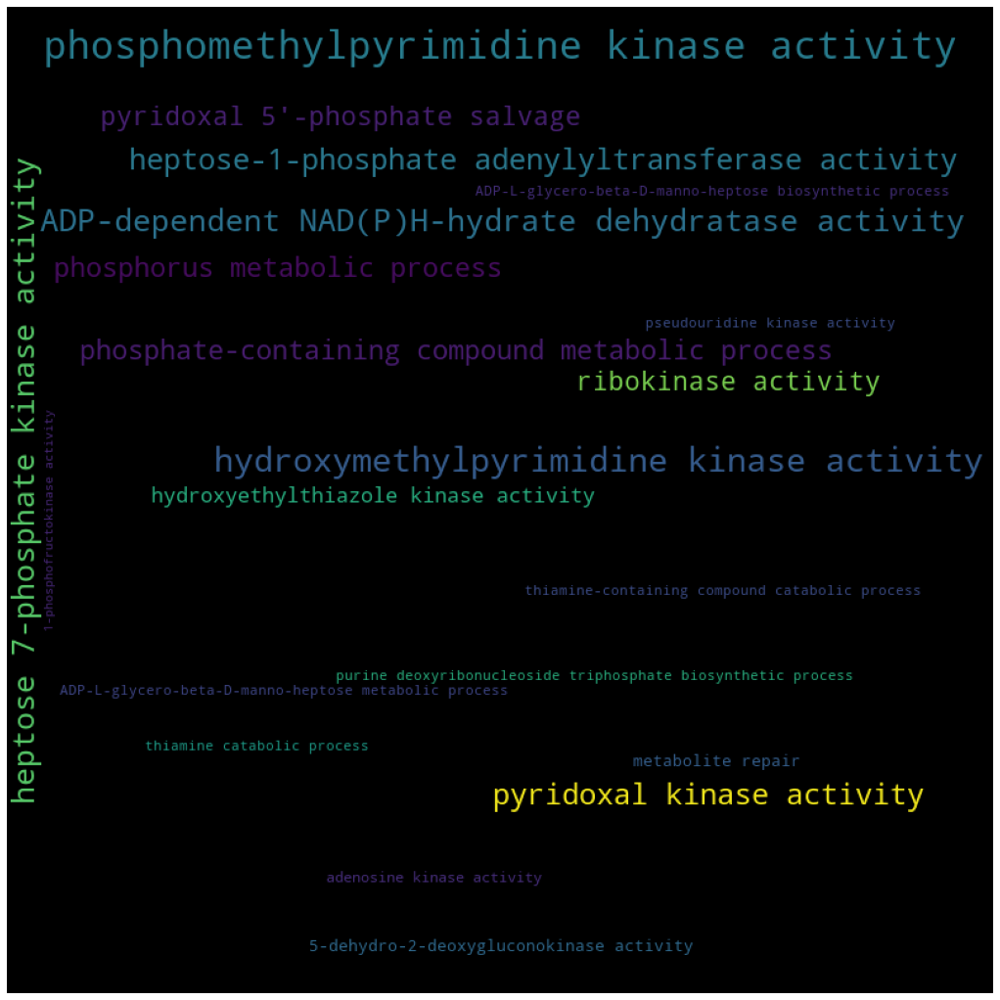

In [48]:
# Create a dictionary from the dataframe
names_dict = dict(zip(folds["description"], folds["fold_increase"]))

# Create the wordcloud
wordcloud = WordCloud(width = 800, height = 800,
                      min_font_size = 10).generate_from_frequencies(names_dict)

# Plot the wordcloud
plt.figure(figsize=(14, 14), facecolor=None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)

plt.savefig("files/function/out/wordcloud.png", dpi = 200)

# Branches enrichmennt

In [49]:
# Direct children calculation

direct_children = {term : set() for term in graph_dict.keys()}

for term, info in graph_dict.items():
  for ancestor in info["rel"]:
    direct_children[ancestor].add(term)

In [50]:
# Build all possible branches

def depth_first_paths(graph, start):
  stack = [(start, [start])]
  visited = set()
  branches = list()

  while stack:
    node, branch = stack.pop()
    if node not in visited:
      visited.add(node)
      for child in graph.get(node, list()):
        new_branch = branch + [child]
        stack.append((child, new_branch))
        branches.append(new_branch)

  return branches

branches = list()
for root in roots:
  branches.extend(depth_first_paths(direct_children, root))

In [51]:
enrichements = {pair[0] : pair[1] for pair in my_p_values_filtered[["go_term", "fold_increase"]].values}

def paths_analysis(path):
  curr_terms = 0
  folds = []
  for term in path:
    if term in enrichements.keys():
      folds.append(enrichements[term])
      curr_terms += 1
  if folds:
    avg = np.mean(folds)
  else:
    avg = 0
  return avg, curr_terms

enriched_branches_list = list()

for branch in branches:
  enrich = paths_analysis(branch)
  enriched_branches_list.append((graph_dict[branch[0]]["namespace"], tuple(branch), len(branch), enrich[0], enrich[1]))

enriched_branches = pd.DataFrame(enriched_branches_list, columns = ("namespace",
                                                    "branch",
                                                    "branch_length",
                                                    "mean_fold_increase",
                                                    "enriched_temrs")).sort_values("mean_fold_increase", ascending = False)

In [52]:
enriched_branches.head(10)

,namespace,branch,branch_length,mean_fold_increase,enriched_temrs
46721,biological_process,"(GO:0008150, GO:0009987, GO:0044237, GO:000679...",9,1540.740382,5
46691,biological_process,"(GO:0008150, GO:0009987, GO:0044237, GO:000679...",8,1540.740382,5
46684,biological_process,"(GO:0008150, GO:0009987, GO:0044237, GO:000679...",8,1540.740382,5
46685,biological_process,"(GO:0008150, GO:0009987, GO:0044237, GO:000679...",8,1540.740382,5
46686,biological_process,"(GO:0008150, GO:0009987, GO:0044237, GO:000679...",8,1540.740382,5
46687,biological_process,"(GO:0008150, GO:0009987, GO:0044237, GO:000679...",8,1540.740382,5
46688,biological_process,"(GO:0008150, GO:0009987, GO:0044237, GO:000679...",8,1540.740382,5
46870,biological_process,"(GO:0008150, GO:0009987, GO:0044237, GO:000679...",8,1540.740382,5
46689,biological_process,"(GO:0008150, GO:0009987, GO:0044237, GO:000679...",8,1540.740382,5
46690,biological_process,"(GO:0008150, GO:0009987, GO:0044237, GO:000679...",8,1540.740382,5


In [53]:
# Build a nested dictionary for representing the hierarchy of top enriched GO branches

top_enriched_branches = [enriched_branches.iloc[row, 1] for row in range(50)]
hierarchy = build_hierarchy(top_enriched_branches)

# Provide frequencies for each term (for node sizes)

all_terms = [term for branch in top_enriched_branches for term in branch]
node_sizes = Counter(all_terms)

# Extract from the nested dictionary hierarchy nodes and edges for networkx 
nodes, edges = nested_dict_to_nodes_and_edges(hierarchy)

# Build the tree object
G = nx.Graph()
G.add_nodes_from(nodes)
G.add_edges_from(edges)

# Labels making
all_terms = [term for branch in top_enriched_branches for term in branch]
labels = {term : graph_dict[term]['name'] for term in all_terms if node_sizes[term] >= 10}

# Render the tree
save_tree_figure(G, node_sizes, "enriched_branches", "files/function/out/", labels = labels)

# Patterns discovery
In this last section, patterns from ProSite and ELM are searched in specific disordered regions of proteins included in the PSSM-based prediction model. A final frequency for each pattern is provided at the end

In [54]:
pred_part = list(chunks_div(list(pssm_prediction)))

sequences = ""

for part in pred_part:
  r = requests.get(URL_proteins, params={"accession": ",".join(part)}, headers={"Accept": "text/x-fasta"})
  sequences += r.text

f = open("files/motifs/out/my_sequences.fasta", "w")
f.write(sequences)
f.close()

# Retrieve sequences of our model
seq_records = list(SeqIO.parse("files/motifs/out/my_sequences.fasta", "fasta"))

# ELM / ProSite motifs

In [55]:
# Load ProSite patterns

def row_parsing(block, row_id):
  pattern = list()
  for row in block:
    if row[:2] == row_id:
      pattern.append(row.split('   ')[1][:-1])

  pattern = "".join(pattern)

  return pattern

prosite_data = open("files/motifs/prosite.dat.txt")
rows = prosite_data.readlines()
prosite_data.close()
barsplit = "".join(rows).split("//")

barsplit = barsplit[3:] # Remove the header part
barsplit = [block.split("\n") for block in barsplit]

prosite_pa = list()
prosite_de = list()
prosite_ac = list()

def PStoRE(PrositePattern):
    rePattern = PrositePattern
    rePattern = rePattern.replace("-", "")
    rePattern = rePattern.replace("x", ".")
    rePattern = rePattern.replace("{", "[^")
    rePattern = rePattern.replace("}", "]")
    rePattern = rePattern.replace("(", "{")
    rePattern = rePattern.replace(")", "}")
    return rePattern

for block in barsplit:
  prosite_pa.append(PStoRE(row_parsing(block, "PA")))
  prosite_de.append(row_parsing(block, "DE"))
  prosite_ac.append(row_parsing(block, "AC"))

prosite_pa = [PStoRE(pattern) for pattern in prosite_pa]

prosite_data = pd.DataFrame(zip(prosite_pa, prosite_de, prosite_ac), columns = ("Pattern", "Description", "Accession"))
prosite_pattern = prosite_data["Pattern"].values

prosite_descr = dict(zip(prosite_data["Pattern"].values, zip(prosite_data["Accession"].values, prosite_data["Description"].values)))

# Load ProSite descriptions
prosite_de = [row.split("   ")[1][:-1] for row in rows if row[:2] == "DE"]

# ProSite patterns to regex patterns translation (https://www.d.umn.edu/~mhampton/m5233s8march5.html)

# Load ELM classes
elm_data = pd.read_csv("files/motifs/elm_classes.tsv", comment = "#", sep = "\t")
elm_pa = elm_data["Regex"].values

elm_descr = dict(zip(elm_data["Regex"].values, zip(elm_data["Accession"].values, elm_data["FunctionalSiteName"].values)))

# Load disordered regions
DRs_str = pd.read_csv("files/motifs/mobidb_lite_swissprot.csv", sep = ",", header = None)

In [56]:
# Disordered sequences filtering (in order to work only with disordered regions)

# Convert ranges from strings to integers
DRs = dict()

for ind in range(DRs_str.shape[0]):
  prot_entry, str_ranges = DRs_str.iloc[ind, :]
  ranges = ast.literal_eval(str_ranges)
  DRs[prot_entry] = ranges

# Filter disordered domains in our proteins

seq_dict = dict()

for record in seq_records:
  accession = str(record.id).split("|")[1]
  sequence = str(record.seq)
  if accession in DRs.keys():
    ranges = DRs[accession]
    seq_dict[accession] = {"sequence" : sequence, "ranges" : ranges}

# Select only disordered regions in previously filtered proteins

def filter_seq(sequence, ranges):
  sequence_sls = list()
  for range_aa in ranges:
    sequence_sl = sequence[range_aa[0] - 1 : range_aa[1]]
    sequence_sls.append(sequence_sl)
  
  return sequence_sls

seq_dict_filtered = dict()

for accession, data in seq_dict.items():
  sequence = data["sequence"]
  ranges = data["ranges"]
  sequence_filtered = filter_seq(sequence, ranges)
  seq_dict_filtered[accession] = "".join(sequence_filtered)

In [57]:
def flatten_list(lst):
  result = []
  for element in lst:
    if type(element) == tuple:
      result.extend(list(element))
    else:
      result.append(element)
  return result

# ProSite pattern finding

prosite_matches = dict()
for pattern in prosite_pattern:
  for accession, sequence in seq_dict_filtered.items():
    res = re.findall(pattern, sequence)
    if res:
      res = [match_p for match_p in res if len(set(match_p)) > 1]
      prosite_matches[pattern] = (accession, res)

# ELM pattern finding

elm_matches = dict()
for pattern in elm_pa:
  for accession, sequence in seq_dict_filtered.items():
    res = re.findall(pattern, sequence) # Necessary steps to remove sub-tuples
    res = flatten_list(res)
    if res:
      res = [match_p for match_p in res if len(set(match_p)) > 1]
      elm_matches[pattern] = (accession, res)

# Patterns matches count

prosite_matches_count = {pattern : len(matches[1]) for pattern, matches in prosite_matches.items()}
elm_matches_count = {pattern : len(matches[1]) for pattern, matches in elm_matches.items()}

# Final dataframes making

prosite_score = pd.DataFrame(prosite_matches_count.items(), columns = ("pattern", "frequency")).sort_values("frequency", ascending = False)
prosite_score["accession"] = prosite_score["pattern"].apply(lambda pattern: prosite_descr[pattern][0])
prosite_score["functional_site_name"] = prosite_score["pattern"].apply(lambda pattern: prosite_descr[pattern][1])
prosite_score = prosite_score[["accession", "functional_site_name", "pattern", "frequency"]]

elm_score = pd.DataFrame(elm_matches_count.items(), columns = ("pattern", "frequency")).sort_values("frequency", ascending = False)
elm_score["accession"] = elm_score["pattern"].apply(lambda pattern: elm_descr[pattern][0])
elm_score["functional_site_name"] = elm_score["pattern"].apply(lambda pattern: elm_descr[pattern][1])
elm_score = elm_score[["accession", "functional_site_name", "pattern", "frequency"]]

In [58]:
prosite_score.head(10)

,accession,functional_site_name,pattern,frequency
2,PS00006,Casein kinase II phosphorylation site,[ST].[^2][DE],2
0,PS00004,cAMP- and cGMP-dependent protein kinase phosph...,[RK][^2].[ST],1
1,PS00005,Protein kinase C phosphorylation site,[ST].[RK],1
3,PS00008,N-myristoylation site,G[^EDRKHPFYW].[^2][STAGCN][^P],1
4,,,,0


In [59]:
elm_score.head(10)

,accession,functional_site_name,pattern,frequency
40,ELME000012,di Arginine retention/retrieving signal,"([LIVMFYWPR]R[^YFWDE]{0,1}R)|(R[^YFWDE]{0,1}R[...",2
37,ELME000443,Polo-like kinase phosphosites,[DE]..([ST])[EDILMVFWY](([DE].)|(.[DE])),2
22,ELME000155,SH3 ligand,...[PV]..P,2
12,ELME000417,14-3-3 binding phosphopeptide motif,"R[^DE]{0,2}[^DEPG]([ST])(([FWYLMV].)|([^PRIKGN...",2
14,ELME000288,IAP-binding motif (IBM),"^M{0,1}A.[AP].",1
39,ELME000528,Adaptin binding Endosome-Lysosome-Basolateral ...,[^E]..[RP]L[LI],1
25,ELME000135,WW domain ligands,.PPR.,1
24,ELME000365,"WDR5 WD40 repeat (blade 5,6)-binding ligand","[EDSTY].{0,4}[VIPLA][TSDEKR][ILVA]",1
23,ELME000501,CIN85 and CD2AP SH3 domain binding motif,P.[AP].PR,1
21,ELME000006,SH3 ligand,P..P.[KR],1
